In [ ]:
# Initial stuff

import numpy as np
import matplotlib.pyplot as plt
import cmcrameri.cm as cmc
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr
import cmcrameri.cm as cm
import colorcet as cc
import warnings


# default colormap to batlow
plt.rcParams['image.cmap'] = 'cmc.batlow'





# Helper functions


# Crop TROPOMI dataset to given bbox
def crop_to_bbox(
    ds, 
    bbox: list[float] = [-10.0, 35.0, 30.0, 70.0],  # [min_lon, min_lat, max_lon, max_lat]
    save_path: str = None
) -> xr.Dataset:
    """
    Crop xarray Dataset to given bbox.
    """

    if type(ds) is not xr.Dataset:
        ds = xr.open_dataset(ds, group="PRODUCT", mask_and_scale=True)

    print("[+] Cropping data files.")

    # Open dataset
    lon = ds['longitude'][0].data
    lat = ds['latitude'][0].data

    # Mask for points inside bbox
    in_bbox = (lon >= bbox[0]) & (lon <= bbox[2]) & \
                (lat >= bbox[1]) & (lat <= bbox[3])

    if np.any(in_bbox):

        # Find valid rows/cols (at least one point in bbox)
        valid_rows = np.any(in_bbox, axis=1)
        valid_cols = np.any(in_bbox, axis=0)

        in_bbox = in_bbox[valid_rows, :][:, valid_cols]

        ds_crop = ds.isel(scanline=valid_rows, ground_pixel=valid_cols)

        for vars in ds_crop.variables:
            if (("scanline" in ds_crop[vars].coords) 
                and ("ground_pixel" in ds_crop[vars].coords) 
                and (ds_crop[vars].shape == in_bbox.shape) 
                and (vars not in ["time", "latitude", "longitude", "time_utc"])
                ):
                print("[+] Found 'scanline' and 'ground_pixel' coordinates in", vars)
                # Turn values outside bbox to NaN
                ds_crop[vars] = ds_crop[vars].where(in_bbox)

    else:
        print(f"[-] No data in bbox for file")


    if save_path:
        ds_crop.to_netcdf(save_path, group="PRODUCT")
        print(f"[+] Saved cropped dataset to {save_path}")

    return ds_crop


def wind_to_angle_and_magnitude(wind_vector):
    """
    Converts a wind vector or array of wind vectors to angle(s) and magnitude(ies).
    
    Parameters:
    wind_vector : np.ndarray
        Wind vector(s) with the last dimension being 2 (for [wx, wy]).
        Can be 1D [wx, wy], 2D (n, 2), 3D (n, m, 2), or higher dimensions.
    
    Returns:
    tuple
        (wind_angles, wind_magnitudes) with the same shape as the input,
        except the last dimension is removed (since it contained [wx, wy]).
        wind_angle(s) are in radians.
    
    Example:
        Single vector [1, 1] -> scalar, scalar
        Multiple vectors (3, 2) -> (3,), (3,)
        Grid of vectors (n, m, 2) -> (n, m), (n, m)
    """
    wind_vector = np.asarray(wind_vector)
    
    if wind_vector.shape[-1] != 2:
        raise ValueError(f"Last dimension must be 2 (for [wx, wy]), got shape {wind_vector.shape}")
    
    # Avoid -0.0 issues
    wind_vector = wind_vector.copy()
    wind_vector[wind_vector == 0] = 0
    
    # Extract wx and wy using the last dimension
    wx = wind_vector[..., 0]
    wy = wind_vector[..., 1]
    
    wind_magnitude = np.sqrt(wx ** 2 + wy ** 2)
    wind_angle = np.arctan2(wy, wx)
    
    return wind_angle, wind_magnitude



def match_era5_wind_to_tropomi(tropomi_data, era5_data, era5_variables=['wind_magnitude_100m', 'wind_angle_100m', 'wind_magnitude_10m', 'wind_angle_10m']):
    with warnings.catch_warnings():
        warnings.filterwarnings(
            "ignore",
            message="no explicit representation of timezones available for np.datetime64",
            category=UserWarning,
        )
        tropomi_data["time_utc"] = xr.apply_ufunc(
            lambda x: np.datetime64(x, "ns"),
            tropomi_data["time_utc"],
            vectorize=True,
            dask="allowed",
            output_dtypes=[np.dtype("datetime64[ns]")],
        )

    wind_data = {}

    for var in era5_variables:
        wind_data[var] = era5_data[var].sel(
            latitude=tropomi_data.latitude[0],
            longitude=tropomi_data.longitude[0],
            time=tropomi_data.time_utc[0].broadcast_like(tropomi_data["longitude"][0]),
            method="nearest",
        )
    
    return wind_data



def scale_wind_magnitude_for_distance_matrix(wind_magnitudes, method="linear", parameter=None):
    if method == "linear":
        if parameter is None:
            parameter = 0.03  # default linear scaling factor
        return parameter * wind_magnitudes
    elif method == "sqrt":
        if parameter is None:
            parameter = 0.2  # default sqrt scaling factor
        return parameter * np.sqrt(wind_magnitudes)
    elif method == "log":
        if parameter is None:
            parameter = 0.3  # default log scaling factor
        return parameter * np.log(1 + wind_magnitudes)
    else:
        raise ValueError("Unknown scaling method")

# Example 1

[+] Pre-processing data files ...


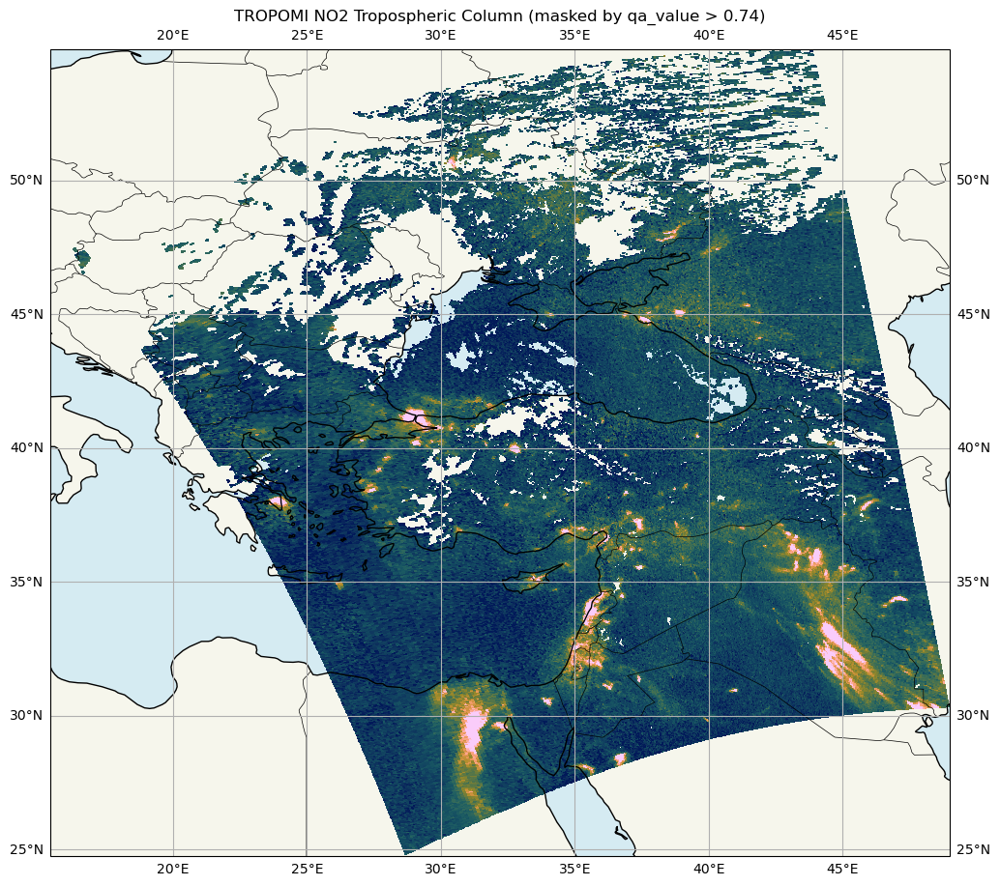

In [2]:
# TROPOMI data

THIS_DIR = os.getcwd()
tropomi_file = "tropomi_data_example.nc"

# Whole data
tropomi_data = xr.open_dataset(os.path.join(THIS_DIR, tropomi_file), group="PRODUCT", mask_and_scale=True)

# Cropped data
tropomi_data_cropped = crop_to_bbox(
        os.path.join(THIS_DIR, tropomi_file),
        bbox = [20.0, 30.0, 45.0, 50.0]
        )


# Get only quality data
qa_value=0.74
qa_mask = (tropomi_data_cropped['qa_value'] > qa_value)[0]
no2 = tropomi_data_cropped['nitrogendioxide_tropospheric_column'][0].data
no2_masked = np.where(qa_mask, no2, np.nan) # replace values where qa_mask is False with NaN

# Plotting
fig, ax = plt.subplots(1,1,figsize=(12, 12), subplot_kw={'projection': ccrs.PlateCarree()})
ax.pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    no2_masked,
    shading='auto',
    vmin=0, vmax=0.0001,
)
# Add map features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.5)
ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.5)
ax.gridlines(draw_labels=True)

ax.set_title("TROPOMI NO2 Tropospheric Column (masked by qa_value > 0.74)")

plt.show()

[Init] Warning: 38931 points with NaN values found. They will be ignored.
[Init] Auto threshold set: 0.0000542. (detection_limit=)2.1 standard deviations from median.  (median=0.0000163, std=0.0000181)
[Start] SCEA: metric=geodesic, growth_limit=2.5, detection_limit=2.1, local_box_size=3, max_pts_start_radius=5, n_clusters=auto
[555] Cluster formed. | current max value: 0.0000542 | stopping threshold: 0.0000542
[Stop] Threshold reached: max active 0.0000542 <= 0.0000542
[Done] Total clusters found: 556, Time taken: 3.80 seconds


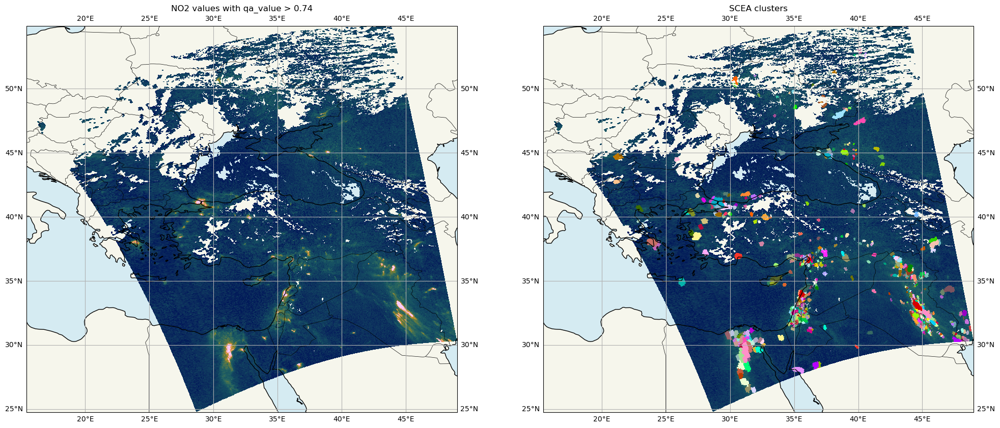

In [3]:
import SCEA_v3 as scea

# Find clusters with SCEA


# Longitude and latitude coordinates as (2, ...) array
point_coordinates = np.array(
    [tropomi_data_cropped['longitude'][0].data, 
     tropomi_data_cropped['latitude'][0].data]
     )


# Run the SCEA algorithm
clusters = scea.scea(
    coords=point_coordinates,   # spatial coordinates (lon,lat)
    values=no2_masked,          # values of points (NO2)     
    growth_limit=2.5,           # controls cluster size, higher values means smaller clusters
    detection_limit=2.1,        # controls cluster detection, higher values means less clusters
    local_box_size=3,           # radius of the local area around a starting point to be cropped and standardized (degrees for lon/lat)
    max_pts_start_radius=5,     # stopping criterion for a radiating point, maximum number of points in the starting radius
    metric="geodesic",          # distance metric ("euclidean", "haversine", "geodesic", "half_ellipse", "geodesic_half_ellipse")
    verbose=True                # whether to print progress messages
)

clusters # same shape as no2_masked, with cluster labels for each point (0 means no cluster, 1,2,... are cluster labels)




# Plotting

fig, ax = plt.subplots(1,2,figsize=(24, 12), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot NO2 values
ax[0].pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    no2_masked,
    shading='auto',
    vmin=0, vmax=0.00018,
)

# Add map features
ax[0].coastlines()
ax[0].add_feature(cfeature.BORDERS, linewidth=0.5)
ax[0].add_feature(cfeature.LAND, alpha=0.5)
ax[0].add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.5)
ax[0].gridlines(draw_labels=True)

ax[0].set_title("NO2 values with qa_value > 0.74")



# Plot NO2 values
ax[1].pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    no2_masked,
    shading='auto',
    vmin=0, vmax=0.00018,
)

# Cluster label 0 to nan before plotting
clusters = np.where(clusters == 0, np.nan, clusters)

# Plot clusters
ax[1].pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    clusters,
    shading='auto',
    cmap=cc.cm.glasbey_light, # categorical colormap for clusters
)

ax[1].coastlines()
ax[1].add_feature(cfeature.BORDERS, linewidth=0.5)
ax[1].add_feature(cfeature.LAND, alpha=0.5)
ax[1].add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.5)
ax[1].gridlines(draw_labels=True)

ax[1].set_title("SCEA clusters")
plt.show()

# Example 2 - SCEA with wind

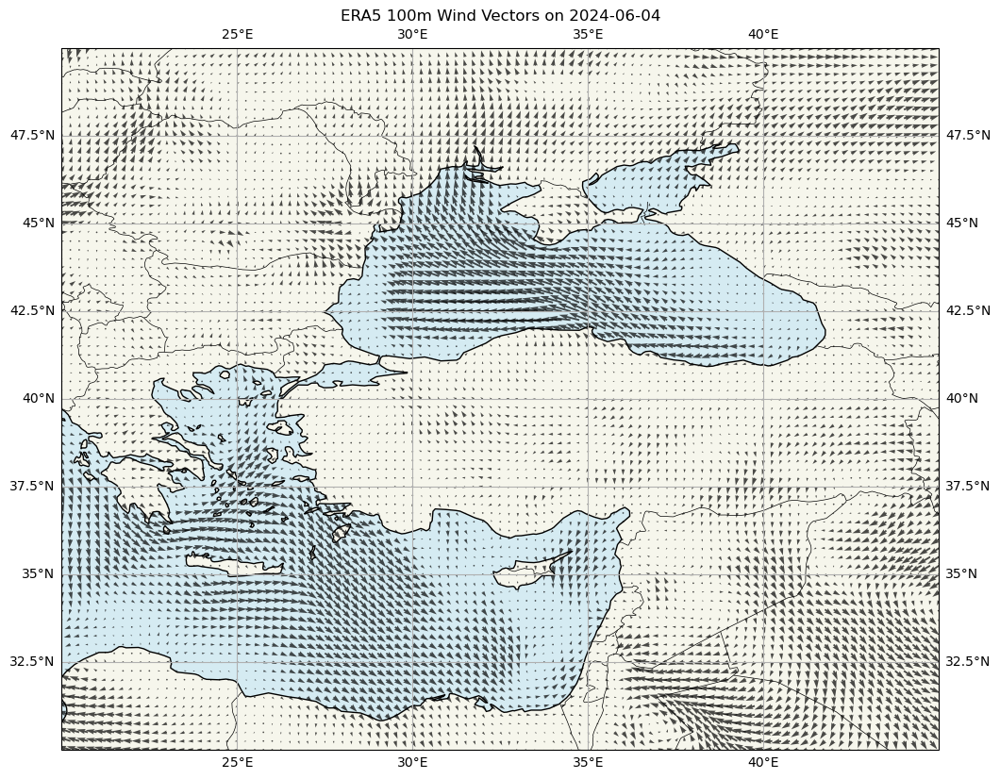

In [4]:
era5_file = 'era5_2024_06_04.nc'

era5_data = xr.open_dataset(os.path.join(THIS_DIR, era5_file), mask_and_scale=True)
era5_data



# Plot wind data with arrows

fig, ax = plt.subplots(1,1,figsize=(12, 12), subplot_kw={'projection': ccrs.PlateCarree()})
ax.quiver(
    era5_data['longitude'].data,
    era5_data['latitude'].data,
    era5_data['u100'][0].data,  # zonal wind component (first time step)
    era5_data['v100'][0].data,  # meridional wind component (first time step)
    scale=500,              # adjust the scale of the arrows
    width=0.002,            # adjust the width of the arrows
    alpha=0.7               # arrow transparency
)

ax.set_extent([20.0, 45.0, 30.0, 50.0], crs=ccrs.PlateCarree()) # zoom to the same bbox as TROPOMI data

# Add map features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.5)
ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.5)
ax.gridlines(draw_labels=True)

ax.set_title('ERA5 100m Wind Vectors on 2024-06-04')
plt.show()

In [5]:
# Wind is in East and North components, so we can convert it to angle and magnitude, if needed 
# (I've already done this step for this ERA5 datafile)

#wind_angle_100m, wind_magnitude_100m = wind_to_angle_and_magnitude(np.stack([era5_data.u100, era5_data.v100], axis=-1))
#era5_data['wind_angle_100m'] = (('time','latitude', 'longitude'), wind_angle_100m)
#era5_data['wind_magnitude_100m'] = (('time', 'latitude', 'longitude',), wind_magnitude_100m)

[Init] Warning: 38931 points with NaN values found. They will be ignored.
[Init] Auto threshold set: 0.0000542. (detection_limit=)2.1 standard deviations from median.  (median=0.0000163, std=0.0000181)
[Start] SCEA: metric=geodesic_half_ellipse, growth_limit=2.5, detection_limit=2.1, local_box_size=3, max_pts_start_radius=5, n_clusters=auto
[555] Cluster formed. | current max value: 0.0000542 | stopping threshold: 0.0000542
[Stop] Threshold reached: max active 0.0000542 <= 0.0000542
[Done] Total clusters found: 556, Time taken: 3.82 seconds


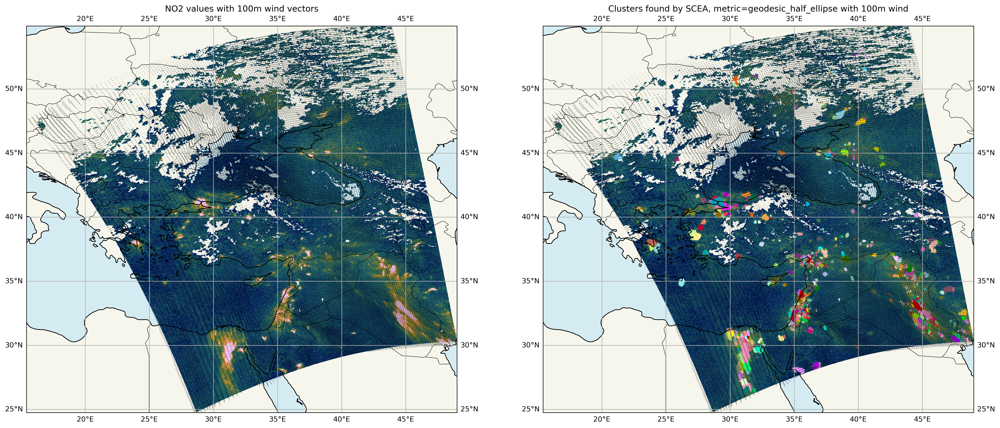

In [6]:
# Match ERA5 wind data to TROPOMI data points (nearest neighbor in space and time)
wind_data_tropomi = match_era5_wind_to_tropomi(tropomi_data_cropped, era5_data)

# Scale wind magnitude suitable for metric
scaled_wind_magnitudes_linear = scale_wind_magnitude_for_distance_matrix(wind_data_tropomi['wind_magnitude_100m'].data.flatten(),method="linear", parameter=0.05)


# Run SCEA with geodesic_half_ellipse metric and 100m wind data
clusters_wind_100m = scea.scea(
    coords=point_coordinates,
    values=no2_masked,
    growth_limit=2.5,                   # controls cluster size, higher values means smaller clusters
    detection_limit=2.1,                # controls cluster detection, higher values means less clusters
    local_box_size=3,                   # radius of the local area around a starting point to be cropped and standardized (degrees for lon/lat)
    max_pts_start_radius=5,             # stopping criterion for a radiating point, maximum number of points in the starting radius
    metric="geodesic_half_ellipse", 
    distance_matrix_kwargs={
        "rotation": wind_data_tropomi['wind_angle_100m'].data.flatten(),
        "magnitude": scaled_wind_magnitudes_linear,
    },
)





# Plot

fig, axs = plt.subplots(1,2,figsize=(24, 12), subplot_kw={'projection': ccrs.PlateCarree()}, dpi=300)

ax = axs[0]

# Add map features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.5)
ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.5)
ax.gridlines(draw_labels=True)
ax.pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    no2_masked,
    shading='auto',
    vmin=0, vmax=0.0001,
)

# Plot NO2 values
ax.pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    no2_masked,
    shading='auto',
    vmin=0, vmax=0.0001,
)

# Add wind direction arrows
skip = (slice(None, None, 3), slice(None, None, 3)) # every 3rd point to avoid overcrowding
ax.quiver(
    tropomi_data_cropped['longitude'][0].data[skip], 
    tropomi_data_cropped['latitude'][0].data[skip],
    wind_data_tropomi["wind_magnitude_100m"].data[skip] * np.cos(wind_data_tropomi["wind_angle_100m"].data[skip]),
    wind_data_tropomi["wind_magnitude_100m"].data[skip] * np.sin(wind_data_tropomi['wind_angle_100m'].data[skip]),
    scale=600,
    width=0.001,
    color='black',
    alpha=0.4,
    headaxislength=3, # controls head proportions
)

ax.set_title("NO2 values with 100m wind vectors")




ax = axs[1]

# Add map features
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, alpha=0.5)
ax.add_feature(cfeature.OCEAN, facecolor='lightblue', alpha=0.5)
ax.gridlines(draw_labels=True)

# Plot NO2 values
ax.pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    no2_masked,
    shading='auto',
    vmin=0, vmax=0.0001,
)

# Cluster label 0 to nan before plotting
clusters_wind_100m = np.where(clusters_wind_100m == 0, np.nan, clusters_wind_100m)

# Plot clusters
ax.pcolormesh(
    tropomi_data_cropped['longitude'][0].data, 
    tropomi_data_cropped['latitude'][0].data, 
    clusters_wind_100m,
    shading='auto',
    cmap=cc.cm.glasbey_light,
)
ax.set_title("Clusters found by SCEA, metric=geodesic_half_ellipse with 100m wind")

# Add wind direction arrows
skip = (slice(None, None, 3), slice(None, None, 3)) # every 3rd point to avoid overcrowding
ax.quiver(
    tropomi_data_cropped['longitude'][0].data[skip], 
    tropomi_data_cropped['latitude'][0].data[skip],
    wind_data_tropomi["wind_magnitude_100m"].data[skip] * np.cos(wind_data_tropomi["wind_angle_100m"].data[skip]),
    wind_data_tropomi["wind_magnitude_100m"].data[skip] * np.sin(wind_data_tropomi['wind_angle_100m'].data[skip]),
    scale=600,
    width=0.001,
    color='black',
    alpha=0.4,
    headaxislength=3,
)

plt.show()